# The primary aim of this project is to identify crime hotspots within the city so as to aid 
# tourists equip themselves with security agents or to avoid these areas entirely while they are on tour.
 # A crime data set of the city of boston was used in this project. The data contains information about crimes such as dates, location, crime group, crime code.

In [ ]:
!pip install folium


In [ ]:
import sys
!{sys.executable} -m pip install pandas-profiling

In [1]:
# Standard imports 

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import seaborn as sns
import folium
from folium.plugins import HeatMap
import pandas_profiling
import plotly.express as px
from sklearn import preprocessing
import datetime as dt    # for linear reg.

from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
#from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [2]:
# Importing the data
from google.colab import files
uploaded = files.upload()

Saving crime.csv to crime.csv


In [5]:
import io
crime_df = pd.read_csv(io.BytesIO(uploaded['crime.csv']) ,encoding='ISO-8859-1')

In [6]:
crime_df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [7]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [8]:
# searching out null values

print(crime_df.isnull().sum(), end = '\n\n')
print(crime_df[(crime_df['Lat'].isnull()) | (crime_df['Long'].isnull())]['Location'].unique())

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

['(0.00000000, 0.00000000)']


In [9]:
crime_df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [10]:
crime_df.info

<bound method DataFrame.info of        INCIDENT_NUMBER  OFFENSE_CODE  ...       Long                     Location
0           I182070945           619  ... -71.139371  (42.35779134, -71.13937053)
1           I182070943          1402  ... -71.060300  (42.30682138, -71.06030035)
2           I182070941          3410  ... -71.072429  (42.34658879, -71.07242943)
3           I182070940          3114  ... -71.078664  (42.33418175, -71.07866441)
4           I182070938          3114  ... -71.090361  (42.27536542, -71.09036101)
...                ...           ...  ...        ...                          ...
319068   I050310906-00          3125  ... -71.085748  (42.33695098, -71.08574813)
319069   I030217815-08           111  ... -71.123172  (42.25592648, -71.12317207)
319070   I030217815-08          3125  ... -71.123172  (42.25592648, -71.12317207)
319071   I010370257-00          3125  ... -71.111565  (42.30233307, -71.11156487)
319072       142052550          3125  ... -71.080290  (42.33383935

In [11]:
crime_df.describe().T

,count,mean,std,min,25%,50%,75%,max
OFFENSE_CODE,319073.0,2317.546956,1185.285543,111.000000,1001.000000,2907.000000,3201.000000,3831.000000
YEAR,319073.0,2016.560586,0.996344,2015.000000,2016.000000,2017.000000,2017.000000,2018.000000
MONTH,319073.0,6.609719,3.273691,1.000000,4.000000,7.000000,9.000000,12.000000
HOUR,319073.0,13.118205,6.294205,0.000000,9.000000,14.000000,18.000000,23.000000
Lat,299074.0,42.214381,2.159766,-1.000000,42.297442,42.325538,42.348624,42.395042
Long,299074.0,-70.908272,3.493618,-71.178674,-71.097135,-71.077524,-71.062467,-1.000000


In [12]:
# renaming columns for clarity

# rename columns
crime_df.rename(columns = {"INCIDENT_NUMBER": "Incident_Number", 
                     "OFFENSE_CODE":"Offense_Code","OFFENSE_CODE_GROUP":"Offense_Code_Group","OFFENSE_DESCRIPTION":"Offense_Description",
                     "DISTRICT": "District","REPORTING_AREA": "Reporting_Area","SHOOTING": "Shooting",
                     "OCCURRED_ON_DATE": "Occurred_On_Date","YEAR": "Year","MONTH": "Month",
                     "DAY_OF_WEEK": "Day_Of_Week","HOUR": "Hour","UCR_PART": "Ucr_Part",
                     "STREET": "Street"
                     }, 
                                 inplace = True)

In [13]:
# We convert the Occurred_On_Date feature from datetime to date. Because we will handle the dates in the project.

crime_df["Occurred_On_Date"] = crime_df["Occurred_On_Date"].apply(pd.to_datetime, errors='coerce')
crime_df["Occurred_On_Date"] = crime_df["Occurred_On_Date"].dt.date

In [14]:
crime_df["Occurred_On_Date"] = crime_df["Occurred_On_Date"].apply(pd.to_datetime, errors='coerce')

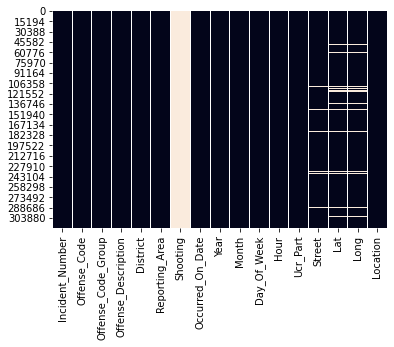

In [15]:
# Let's see how much of the data is null. 99% of the Shooting column consists of null values. Assuming these mean no, replace it with N. (Yes = there is shooting, No = no shooting)
# Also, 0.06% of the Lat and Long values are missing. Since we have a small number of null values compared to our data, we can remove them.
# Let's remove the remaining missing values from the data.

sns.heatmap(crime_df.isnull(), cbar=False)

In [16]:
#missing data
total = crime_df.isnull().sum().sort_values(ascending=False)
percent = (crime_df.isnull().sum()/crime_df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(8)

,Total,Percent
Shooting,318054,0.996806
Lat,19999,0.062678
Long,19999,0.062678
Street,10871,0.034071
District,1765,0.005532
Ucr_Part,90,0.000282
Location,0,0.000000
Reporting_Area,0,0.000000


In [17]:
# filling in the null-values in the Shooting column with N. Because it is assumed nulls were not shooting.

crime_df.Shooting.fillna('N', inplace=True)

In [19]:
# removing the remaining Null/NaN values. Because it was a small part of the crime data set.

crime_df=crime_df.dropna()

In [20]:
# EDA

crime_df.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Ucr_Part',
       'Street', 'Lat', 'Long', 'Location'],
      dtype='object')

In [21]:
# Let's group them together to see how many unique Offense Code there are for each Offense Code Group.

off_code = crime_df.groupby('Offense_Code_Group')['Offense_Code'].nunique().sort_values(ascending = False)
off_code.to_frame().reset_index()

,Offense_Code_Group,Offense_Code
0,Drug Violation,26
1,Other,21
2,Larceny,13
3,Motor Vehicle Accident Response,11
4,Robbery,10
...,...,...
58,Harassment,1
59,Harbor Related Incidents,1
60,Homicide,1
61,Investigate Person,1


In [22]:
# Ucr Part is the most general category that defines crimes. UCR is published by the FBI and stands for uniform crime reports. UCR Part 1 represents the most important/dangerous crimes.

print(crime_df["Ucr_Part"].unique())

['Part One' 'Part Two' 'Part Three' 'Other']


In [23]:
# We have years and months in our data, but we create the seasons column to see seasonality.

def getSeason(month):
    if (month == 12 or month == 1 or month == 2):
       return "Winter"
    elif(month == 3 or month == 4 or month == 5):
       return "Spring"
    elif(month ==6 or month==7 or month == 8):
       return "Summer"
    else:
       return "Fall"

In [24]:
crime_df['Season'] = crime_df.Month.apply(getSeason)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
# Day and night

crime_df['Day'] = 0
crime_df['Night'] = 0
# Day or night for 1st month
crime_df['Day'].loc[(crime_df['Hour'] >= 6) & (crime_df['Hour'] <= 18)] = 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus

In [26]:
crime_df['Night'].loc[crime_df['Day']==0]=1

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



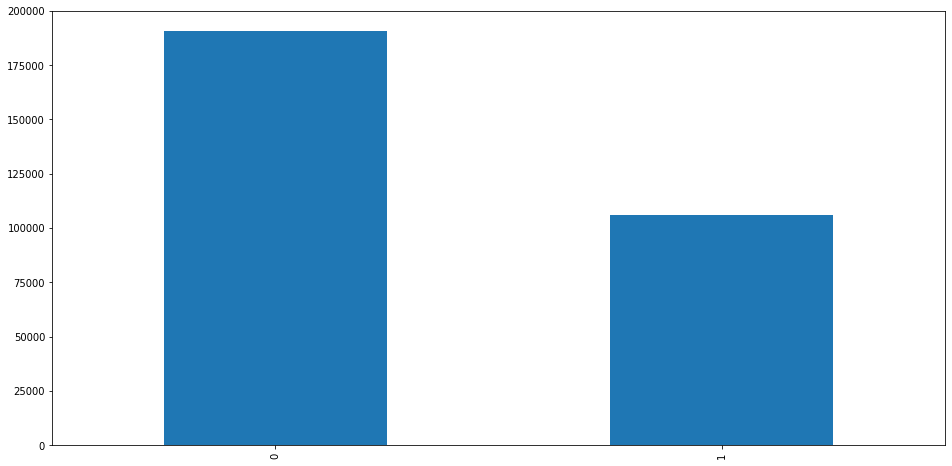

In [27]:
plt.figure(figsize=(16,8))
crime_df['Night'].value_counts().plot.bar()
plt.show()

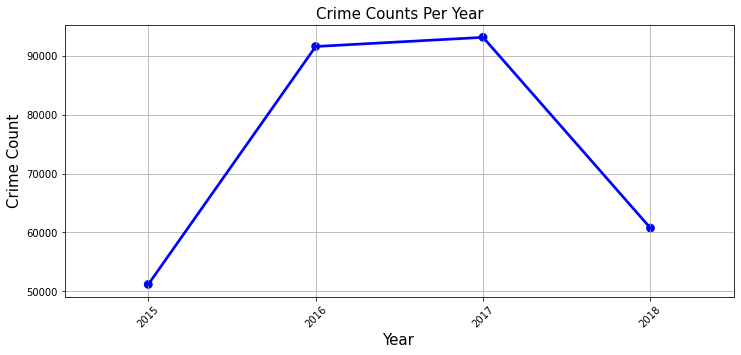

In [28]:
# Crime counts per year

year_count = []

for i in crime_df.Year.unique():
    year_count.append(len(crime_df[crime_df['Year']==i]))

plt.figure(figsize=(12,5))
sns.pointplot(x=crime_df.Year.unique(),y=year_count,color='blue',alpha=0.8)
plt.xlabel('Year',fontsize = 15)
plt.xticks(rotation=45)
plt.ylabel('Crime Count',fontsize = 15)
plt.title('Crime Counts Per Year',fontsize = 15)
plt.grid()
plt.show()

Text(0.5, 1.0, 'Number Of Crimes Each Season')

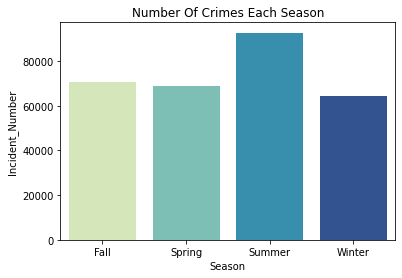

In [32]:
# Number Of Crimes Each Season

season_counts = crime_df.groupby('Season').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Season' , y="Incident_Number", data = season_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Season')

Text(0.5, 1.0, 'Number Of Crimes Each Month')

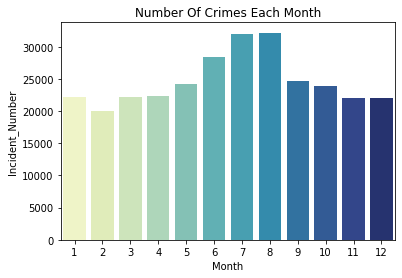

In [33]:
# Number Of Crimes Each Month

month_counts = crime_df.groupby('Month').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Month' , y="Incident_Number", data = month_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Month')

  Day_Of_Week  Incident_Number
0      Friday            45133
1      Monday            42469
2    Saturday            41569
3      Sunday            37677
4    Thursday            43283
5     Tuesday            42997
6   Wednesday            43445


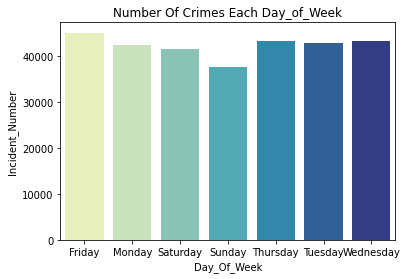

In [34]:
# Number Of Crimes Each Day_of_Week

day_counts = crime_df.groupby('Day_Of_Week').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Day_Of_Week' , y="Incident_Number", data = day_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Day_of_Week')
print(day_counts)

Text(0.5, 1.0, 'Crime counts per year and month')

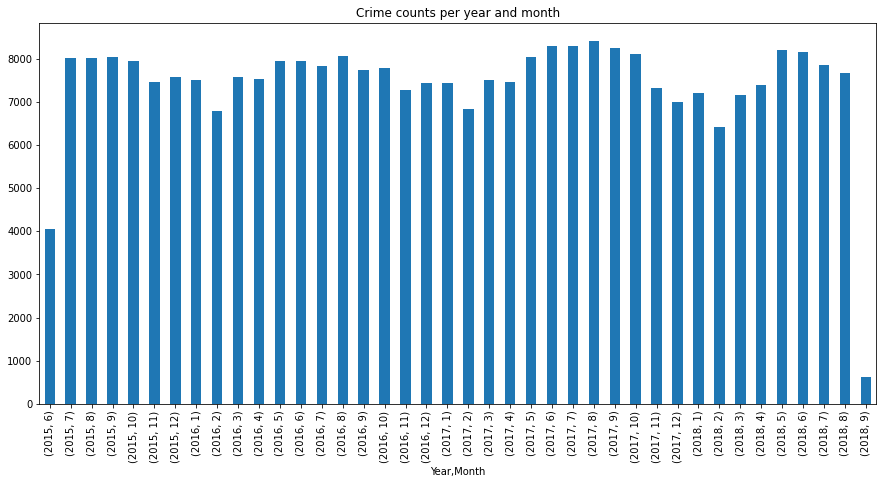

In [35]:
# Crimes by Month of Year

plt.figure(figsize=(15,7))
crime_df.groupby(['Year','Month']).count()['Incident_Number'].plot.bar()
plt.title('Crime counts per year and month')

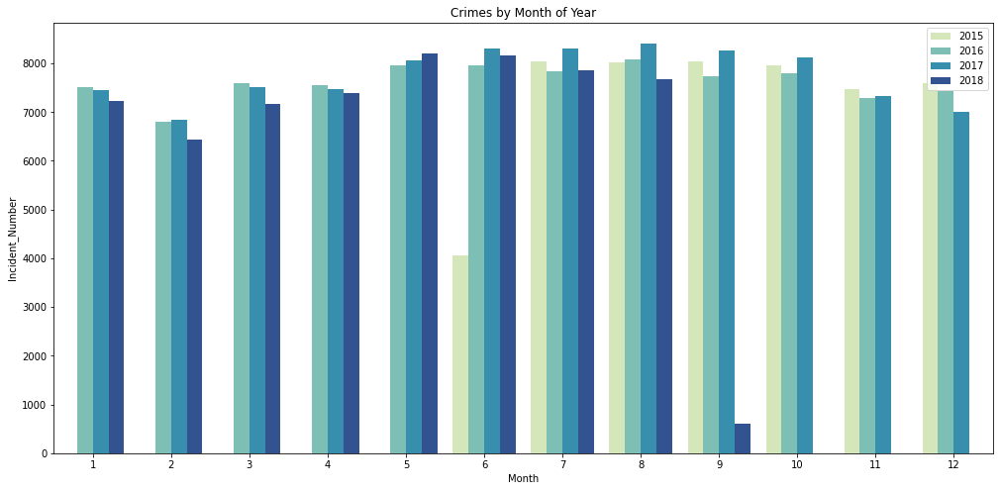

In [36]:

# According to the chart below, we do not have data for the first 5 months of 2015 and the last 3 months of 2018. When we look at the number of crimes committed by years, we see that there were fewer crimes in 2015 and 2018 for this reason.

ig, ax = plt.subplots(figsize=(17,8))
# with sns.color_palette("RdGy", 10):
montyearAggregated = pd.DataFrame(crime_df.groupby(["Month","Year"])["Incident_Number"].count()).reset_index()
a=sns.barplot(data=montyearAggregated,x="Month", y="Incident_Number",hue = 'Year', palette='YlGnBu')
a.set_title("Crimes by Month of Year",fontsize=12)
plt.legend(loc='upper right')
plt.show()

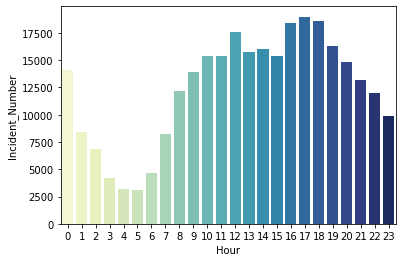

In [37]:
hour_nums = crime_df.groupby(['Hour']).count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Hour' , y="Incident_Number", data = hour_nums,  palette='YlGnBu')

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3747: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



<Figure size 576x576 with 0 Axes>

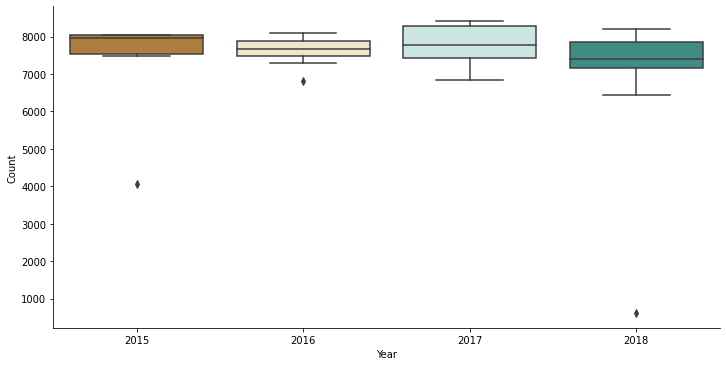

In [38]:
# Incıdent Number

df_year_new=crime_df.groupby(["Year","Month"])["Incident_Number"].count().reset_index()
df_year_filter=df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
fig = plt.figure(figsize=(8,8))
with sns.color_palette("BrBG",4):
    ctplt2=sns.catplot(x="Year", y="Incident_Number",kind="box", data=df_year_new,size=5, aspect=2)
    plt.ylabel('Count')
    plt.show();

Year
2015    51187
2016    91545
2017    93097
2018    60744
Name: Incident_Number, dtype: int64


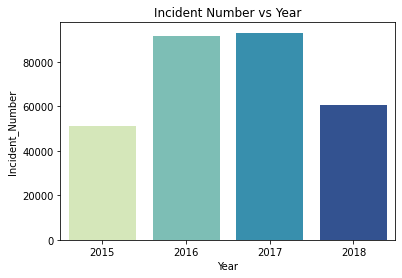

In [40]:
plt.title('Incident Number vs Year')
year_counts = crime_df.groupby('Year').count()['Incident_Number'].to_frame().reset_index()
print(crime_df.groupby('Year').count()['Incident_Number'])
ax = sns.barplot(x = 'Year' , y="Incident_Number", data = year_counts, palette='YlGnBu')

In [42]:
print('Count of Months Per Year:\n',crime_df.groupby('Year')['Month'].nunique())
av_month = (crime_df.groupby('Year').count()['Incident_Number'] / crime_df.groupby('Year')['Month'].nunique()).to_frame().reset_index()

print('\nAverage monthly incident per year:\n',av_month)
av_month.rename(columns = {0:'Incident_n-Number'}, inplace = True)

Count of Months Per Year:
 Year
2015     7
2016    12
2017    12
2018     9
Name: Month, dtype: int64

Average monthly incident per year:
    Year            0
0  2015  7312.428571
1  2016  7628.750000
2  2017  7758.083333
3  2018  6749.333333


In [47]:
# We see that average daily casesare quite close to each other. The daily average increases a couple of incidents from 2015 to 2016 and increase a couple from 2016 to 2017 as well while there is around 7 incident decrease from 2017 to 2018.
# Let's consider our data on a daily basis to make the most accurate assumptions.

print("Min date:  ", crime_df.min()['Occurred_On_Date'])
print("Max date:  ", crime_df.max()['Occurred_On_Date'])
print("--------------------------------------------")
crime_df['Occurred_On_Date'] = pd.to_datetime(crime_df['Occurred_On_Date'])
yearly_counts = crime_df.groupby('Year').count()['Incident_Number'].to_numpy()
days = [(crime_df[crime_df['Year'] == year].Occurred_On_Date.max() - crime_df[crime_df['Year'] == year].Occurred_On_Date.min()).days for year in crime_df.Year.sort_values().unique()]
average_daily_incidents = yearly_counts/days
print("Average Daily Crimes:  ")
print([str(year)+": "+str(avg)[:4] for year, avg in enumerate(average_daily_incidents, 2015)])

Min date:   2015-06-15 00:00:00
Max date:   2018-09-03 00:00:00
--------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Average Daily Crimes:  
['2015: 257.', '2016: 250.', '2017: 255.', '2018: 247.']


[Text(0, 0, '2015'),
 Text(0, 0, '2016'),
 Text(0, 0, '2017'),
 Text(0, 0, '2018')]

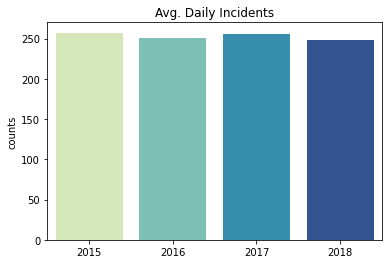

In [50]:
d_avg = pd.DataFrame(data = average_daily_incidents, index = av_month.index)
d_avg.rename(columns = {0:'counts'}, inplace = True)
plt.title('Avg. Daily Incidents')

ax = sns.barplot(x = d_avg.index , y="counts", data = d_avg,palette='YlGnBu' )
ax.set_xticklabels(crime_df.Year.sort_values().unique())

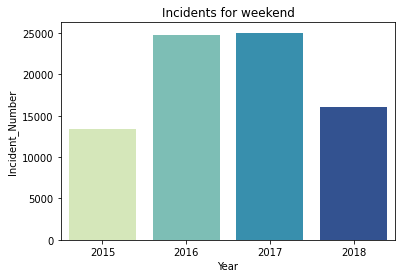

In [53]:
# Weekend vs. Weekday
# As seen in the graphs below, there is no significant difference in the number of cases on weekdays and weekends.

weekend = crime_df[(crime_df['Day_Of_Week'] == 'Saturday') | (crime_df['Day_Of_Week'] == 'Sunday')]
weekday = crime_df[(crime_df['Day_Of_Week']!= 'Saturday') & (crime_df['Day_Of_Week'] != 'Sunday')]

weekday_year = weekday.groupby('Year').count()['Incident_Number'].to_frame()
weekend_year = weekend.groupby('Year').count()['Incident_Number'].to_frame()
plt.title('Incidents for weekend')

ax = sns.barplot(x = weekend_year.index , y="Incident_Number", data = weekend_year,palette='YlGnBu')

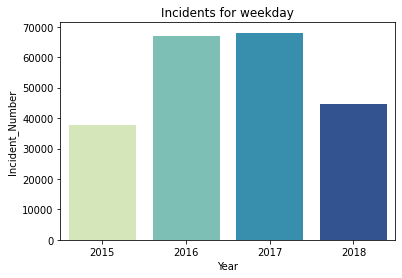

In [54]:
plt.title('Incidents for weekday')
ax = sns.barplot(x = weekday_year.index , y="Incident_Number", data = weekday_year,palette='YlGnBu')

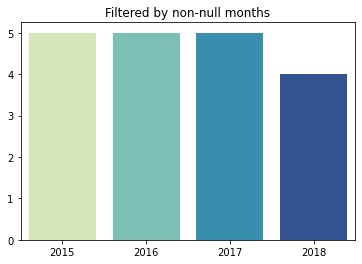

In [55]:
# As a result, there are months in our data with missing data. However, if we go deeper and look on a day basis, we see that there is no significant difference. We have to care about missing data in our analysis.

plt.title('Filtered by non-null months')
monthCrimes = df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
yearly_counts = monthCrimes.groupby('Year').count()['Incident_Number'].to_numpy()
ax = sns.barplot(x = [2015, 2016, 2017, 2018] , y=yearly_counts,palette='YlGnBu')

Text(-8.949999999999996, 0.5, 'Count')

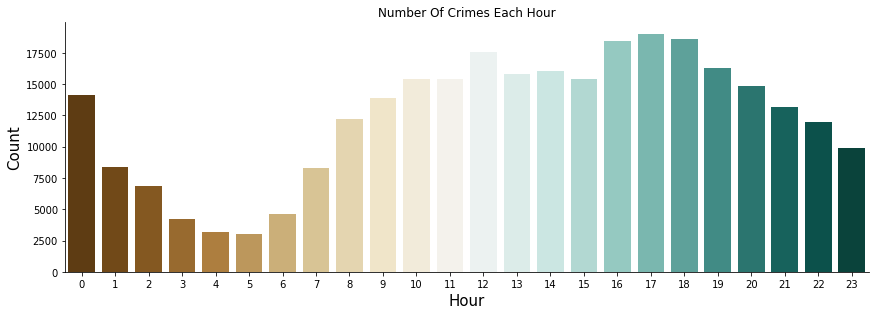

In [57]:
# Is it possible to predict where or when a crime will be committed?

sns.catplot(x='Hour',
           kind='count',
            height=4, 
            aspect=3,
            palette='BrBG',
            #color='BrBG',
           data=crime_df)
plt.title('Number Of Crimes Each Hour')
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlabel('Hour', fontsize=15)
plt.ylabel('Count', fontsize=15)

In [ ]:
# In the chart above, the most crimes occur around 17:00, 18:00 and 12:00. The reason for this may be that students / employees coincide with work hours and breaks. The number of crimes is likely to increase with the increasing number of people on the street.

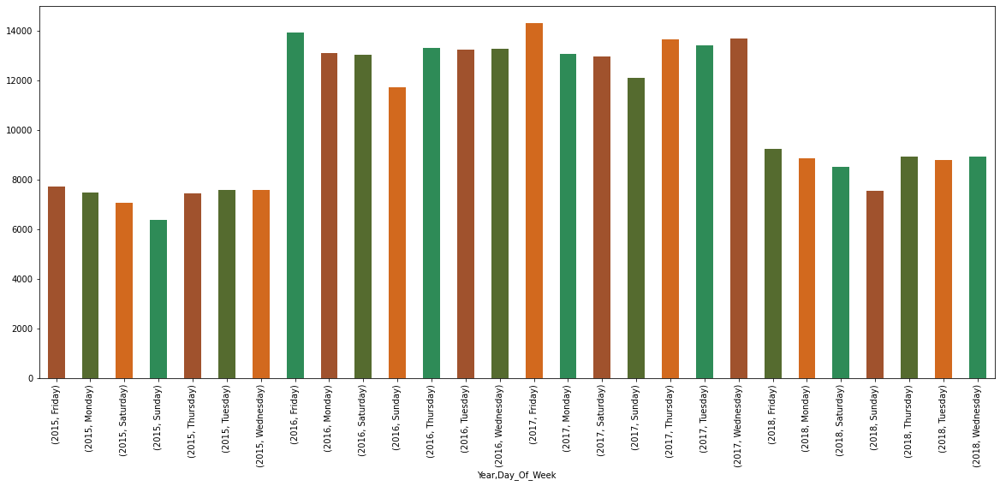

In [58]:
# Incident counts per week day per year

plt.figure(figsize=(20,8))
crime_df.groupby(['Year','Day_Of_Week']).count()['Incident_Number'].plot.bar(color = ['sienna', 'darkolivegreen', 'chocolate', 'seagreen'])

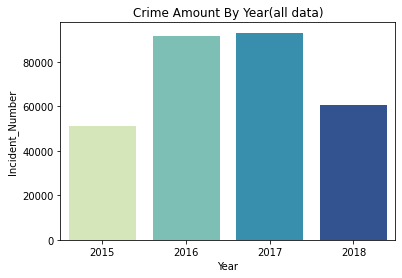

In [59]:
plt.title("Crime Amount By Year(all data)")
years = crime_df.groupby('Year').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Year' , y="Incident_Number", data = years, palette='YlGnBu')

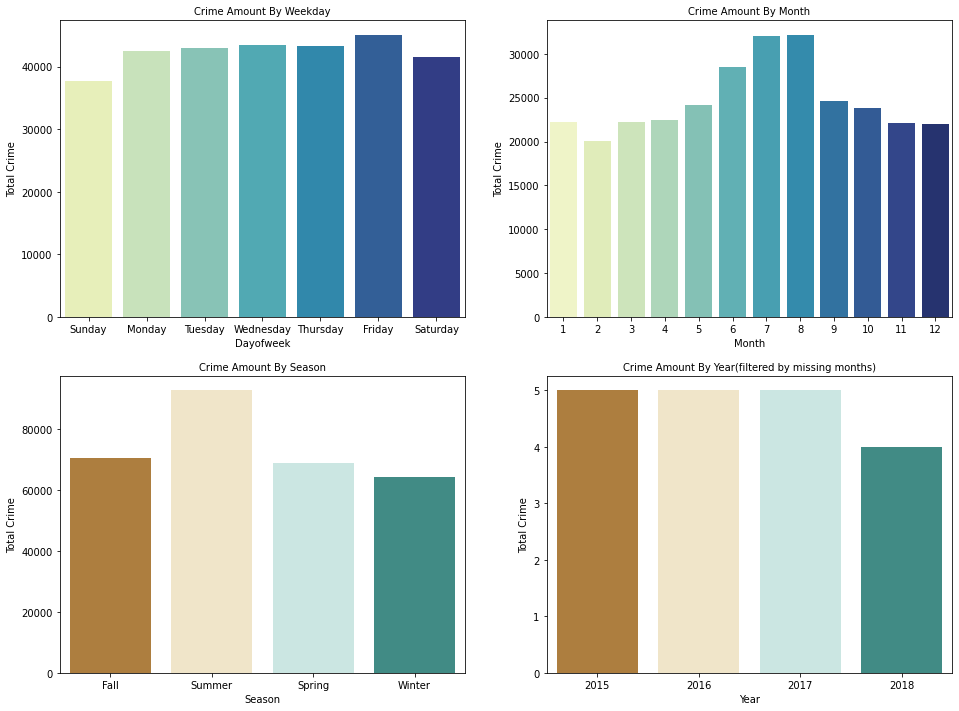

In [60]:
fig,axes= plt.subplots(2,2)
fig.set_size_inches(16,12)
with sns.color_palette('BrBG',4):
  a=sns.countplot(x="Day_Of_Week",order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],data=crime_df,ax=axes[0, 0],palette='YlGnBu')
  a.set(xlabel='Dayofweek', ylabel='Total Crime')
  a.set_title("Crime Amount By Weekday",fontsize=10)

  b=sns.countplot(x="Month",data=crime_df,ax=axes[0, 1],palette='YlGnBu')
  b.set(xlabel='Month', ylabel='Total Crime')
  b.set_title("Crime Amount By Month",fontsize=10)

  c=sns.countplot(x="Season",data=crime_df,ax=axes[1, 0])
  c.set(xlabel='Season', ylabel='Total Crime')
  c.set_title("Crime Amount By Season",fontsize=10)


   
  #df_year_new=data.groupby(["Year","Month"])["Incident_Number"].count().reset_index()
  #df_year_filter=df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
  d=sns.countplot(x="Year",data=df_year_filter,ax=axes[1, 1])
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set_title("Crime Amount By Year(filtered by missing months)",fontsize=10);

In [ ]:
# The most crimes seem to be on Friday. The months with the most crimes appear to be July and August (Crime Amount By Month chart), which coincides with the summer season in the Crime Amount By Season chart.
# When we plot again by taking only the months of data entered, we can see that the crime entries are close in the chart called Crime Amount By Year and 2018 is lower than the others.

Text(0.05, 0.95, 'Timeline of the most frequent crimes(2015-2018).')

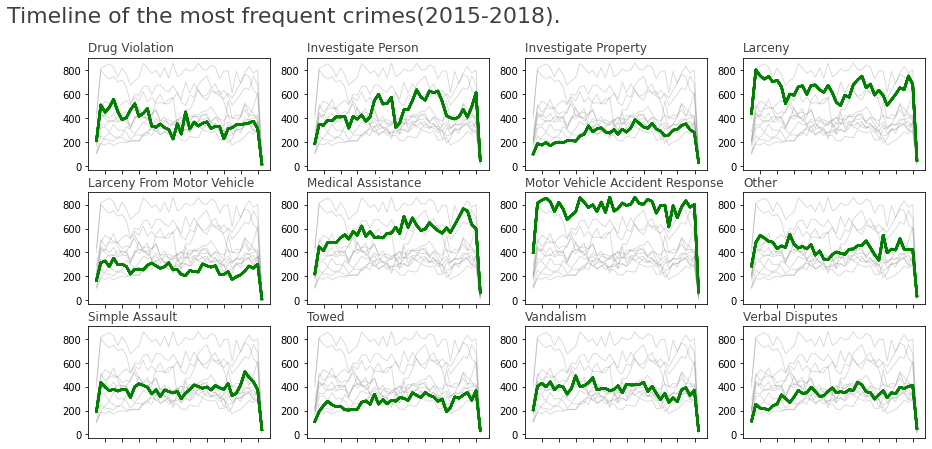

In [61]:
# Crimes can behave differently over the years. We can say that the Medical Assistance crimes saw a rise over the years. We can observe a similar trend with the Investigate Person crime type.

ten_freq_crimes = crime_df["Offense_Code_Group"].value_counts()[:12]
df_top_crimes = crime_df[crime_df["Offense_Code_Group"].isin(ten_freq_crimes.index)]
df_tp = df_top_crimes.pivot_table(index=df_top_crimes["Occurred_On_Date"],
                                                      columns=["Offense_Code_Group"],aggfunc="size", fill_value=0).resample("M").sum()

#palette = plt.get_cmap('Set2')
num=0
ax,fix = plt.subplots(figsize=(15,7))
for column in df_tp:
    num+=1
    plt.subplot(3,4, num)
    for v in df_tp:
        plt.plot(df_tp.index,v,data=df_tp,marker='', color='grey', linewidth=0.9, alpha=0.3)
        plt.tick_params(labelbottom=False)
        plt.plot(df_tp.index,column, data=df_tp,color="green", linewidth=2.4, alpha=0.75, label=column)
        plt.title(column, loc='left', fontsize=12, fontweight=0, color="black", alpha=0.75)
ax.text(x=0.05,y=0.95,s="Timeline of the most frequent crimes(2015-2018).",alpha=0.75, fontsize=22)

In [ ]:
# We can predict possible crimes based on historical data. We can use different time zones such as day and night to strengthen our forecast

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



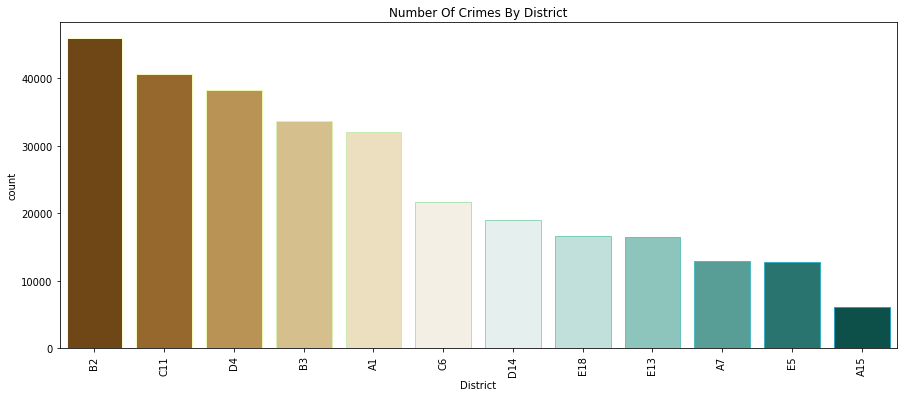

In [62]:
# Where?

plt.subplots(figsize=(15,6))
sns.countplot('District',palette='BrBG',data=crime_df,edgecolor=sns.color_palette('YlGnBu',20),order=crime_df['District'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Number Of Crimes By District')
plt.show()

In [ ]:
# From the graph above, we can say that the most crimes occur in the B2 district.

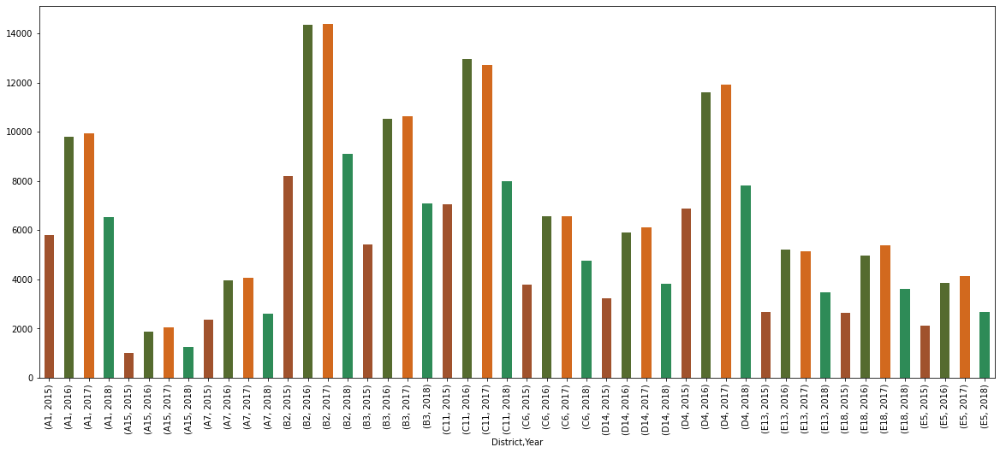

In [63]:
# Crime Numbers of Districts by Years
# More crime appears in all districts in 2016 and 2017. This is no surprise.

plt.figure(figsize=(20,8))
crime_df.groupby(['District','Year']).count()['Incident_Number'].plot.bar(color = ['sienna', 'darkolivegreen', 'chocolate', 'seagreen'])

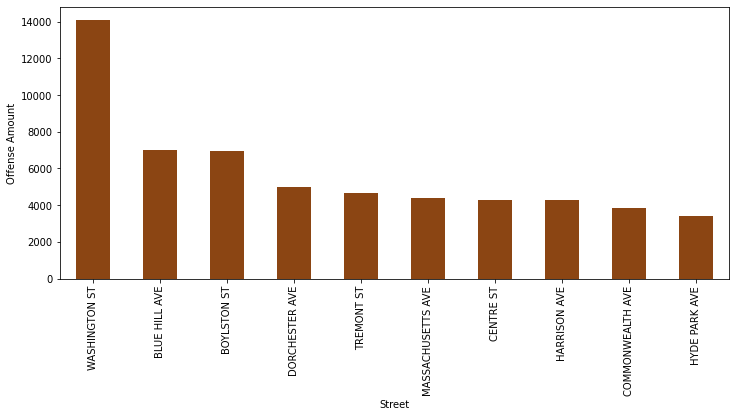

In [64]:
# Number of crimes by Street

fig = plt.figure(figsize=(12,5))
crime_street = crime_df.groupby('Street')['Incident_Number'].count().nlargest(10)
crime_street.plot(kind='bar', color ="saddlebrown")
plt.xlabel("Street")
plt.ylabel("Offense Amount")
plt.show()

In [ ]:
# In the plot above, it can be seen that the streets with the most crime. According to the chart, Washington St is the street with the most crime, it is Blue Hill Ave and Boylston St. is following.

In [65]:
# checking to be sure how many streets a district has.

(crime_df.groupby('District')['Street'].nunique().sort_values(ascending = False).to_frame()).head()

,Street
District,
C11,605
B2,579
E5,508
E18,416
B3,403


In [ ]:
# In this graph, the distribution of crimes by districts can be seen. We can interpret that theft crime was mostly seen in the D4 region, and the crimes in the motor vehicle accident group were seen in the B2 district. By looking at which time, which street, which crime was most committed in which district, etc., we can speculate on where and when the possible crimes will be committed.

In [66]:
# Crime by Location

((crime_df.groupby(["Lat","Long"]).count()[['Incident_Number']]).reset_index()).head()

,Lat,Long,Incident_Number
0,-1.000000,-1.000000,152
1,42.232413,-71.129715,10
2,42.232656,-71.130700,2
3,42.232870,-71.130050,5
4,42.232907,-71.131671,3


In [ ]:
# We can guess the districts and streets. Classification will be useful here. But we have too many streets, that could be a problem.
# We can say that the most crimes occur in the B2 district.
# We can see the streets with the most crime.

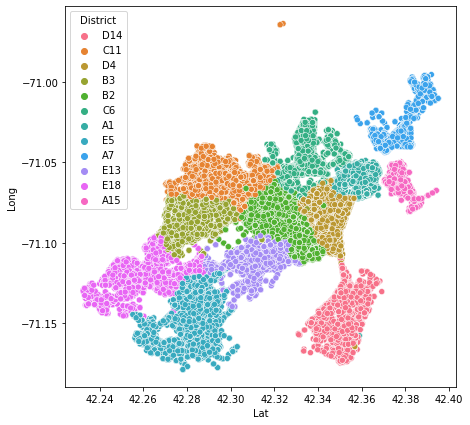

In [68]:
# In this section, the aim is to see how crimes are distributed in the city. Since there are many streets and reporting arenas, we will look at the districts. We have 12 different districts.

plt.figure(figsize=(7,7))
sp = crime_df[(crime_df['Lat'] != -1) & (crime_df['Long'] != -1)]
sns.scatterplot(x="Lat", y="Long",hue='District',data=sp)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



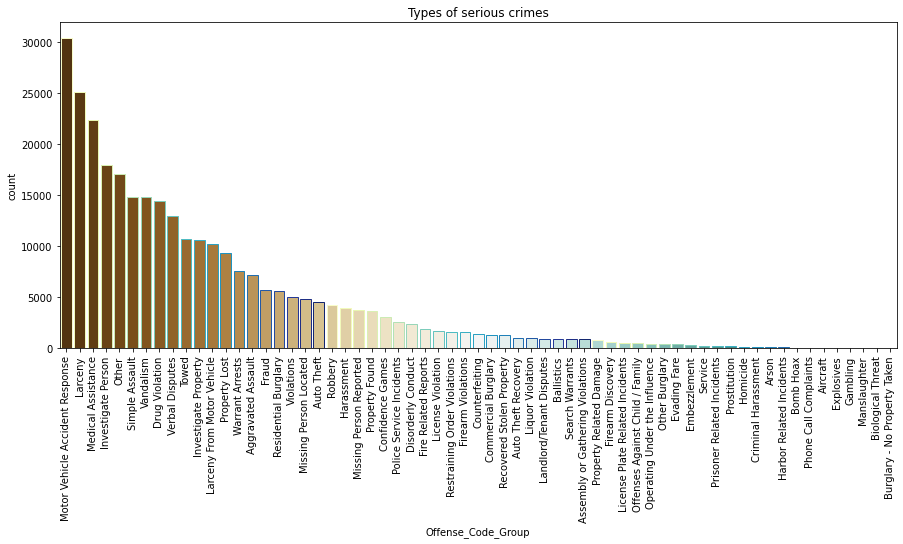

In [69]:
# According to the graph below, the most common crimes are motor vehicle accident and larcency.

plt.subplots(figsize=(15,6))
sns.countplot('Offense_Code_Group',palette='BrBG',data=crime_df,edgecolor=sns.color_palette('YlGnBu',20),order=crime_df['Offense_Code_Group'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Types of serious crimes')
plt.show()

In [70]:
# General distribution of crimes with heat map

# Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                      zoom_start = 13)
 
# data_heatmap = data[data.Year ==  2016]   

data_heatmap = crime_df[['Lat','Long']]
data_heatmap = crime_df.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

crime_map

In [71]:
### Feature Encoding
# Shooting
# We encoded the shooting column to use it in models. We changed it to 0 if there is no shooting, and 1 if there is.

# if Shooting is No =  0, Yes = 1 .
def isShooting(dataFrame):
    dataFrame["Shooting"] = dataFrame["Shooting"].apply(lambda x: 1 if x == "Y" else 0)
    return dataFrame
data = isShooting(crime_df)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [72]:
# Day Of Week
# We encode days of week with mapping.

data["DayOfWeek"] = data["Day_Of_Week"].map({
    "Monday":1,
    "Tuesday":2,
    "Wednesday":3,
    "Thursday":4,
    "Friday":5,
    "Saturday":6,
    "Sunday":7
})

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
# Season names can be challenging while developing models. Instead, we will use the numbers below.

# Fall:0
# Spring: 1
# Summer: 2
# Winter:3

# Fall:0 , Spring: 1 , Summer: 2 , Winter:3
le = preprocessing.LabelEncoder()
data['Seasons'] = le.fit_transform(data['Season'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [74]:
data = data.drop("Season", axis = 1)

In [75]:
data["Ucr_Parts"] = data["Ucr_Part"].map({
    "Part One":1,
    "Part Two":2,
    "Part Three":3,
    "Other":0
})

In [76]:
data = data.drop("Ucr_Part", axis = 1)

In [77]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts'],
      dtype='object')

In [78]:
# sort
data = data.sort_values(by =['Occurred_On_Date'], ascending=False)
data[[  'District', 'Shooting','Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour',  'Night', 'DayOfWeek', 'Seasons','Ucr_Parts']]

,District,Shooting,Occurred_On_Date,Year,Month,Day_Of_Week,Hour,Night,DayOfWeek,Seasons,Ucr_Parts
149,B2,0,2018-09-03,2018,9,Monday,9,0,1,0,3
137,E18,0,2018-09-03,2018,9,Monday,10,0,1,0,3
127,C11,0,2018-09-03,2018,9,Monday,11,0,1,0,2
128,C11,0,2018-09-03,2018,9,Monday,11,0,1,0,3
129,A1,0,2018-09-03,2018,9,Monday,11,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...
318627,D4,0,2015-06-15,2015,6,Monday,10,0,1,2,3
318626,D4,0,2015-06-15,2015,6,Monday,0,1,1,2,1
318625,D4,0,2015-06-15,2015,6,Monday,12,0,1,2,3
318624,B2,0,2015-06-15,2015,6,Monday,12,0,1,2,3


In [79]:
data

,Incident_Number,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On_Date,Year,Month,Day_Of_Week,Hour,Street,Lat,Long,Location,Day,Night,DayOfWeek,Seasons,Ucr_Parts
149,I182070778,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,B2,904,0,2018-09-03,2018,9,Monday,9,WHEATLEY WAY,42.329358,-71.079746,"(42.32935767, -71.07974589)",1,0,1,0,3
137,I182070787,3410,Towed,TOWED MOTOR VEHICLE,E18,499,0,2018-09-03,2018,9,Monday,10,NAVARRE ST,42.277589,-71.117552,"(42.27758926, -71.11755202)",1,0,1,0,3
127,I182070798,2629,Harassment,HARASSMENT,C11,450,0,2018-09-03,2018,9,Monday,11,WASHINGTON ST,42.291316,-71.071703,"(42.29131613, -71.07170293)",1,0,1,0,2
128,I182070797,3301,Verbal Disputes,VERBAL DISPUTE,C11,341,0,2018-09-03,2018,9,Monday,11,SPEEDWELL ST,42.304067,-71.067600,"(42.30406722, -71.06760042)",1,0,1,0,3
129,I182070796,3115,Investigate Person,INVESTIGATE PERSON,A1,61,0,2018-09-03,2018,9,Monday,11,BEVERLY ST,42.366587,-71.060199,"(42.36658726, -71.06019881)",1,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318627,I152049587,3410,Towed,TOWED MOTOR VEHICLE,D4,151,0,2015-06-15,2015,6,Monday,10,CLARENDON ST,42.346795,-71.073294,"(42.34679470, -71.07329384)",1,0,1,2,3
318626,I152049588,614,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,D4,155,0,2015-06-15,2015,6,Monday,0,CONCORD SQ,42.341384,-71.078989,"(42.34138415, -71.07898883)",0,1,1,2,1
318625,I152049589,3301,Verbal Disputes,VERBAL DISPUTE,D4,618,0,2015-06-15,2015,6,Monday,12,HEMENWAY ST,42.341466,-71.090828,"(42.34146610, -71.09082781)",1,0,1,2,3
318624,I152049590,3114,Investigate Property,INVESTIGATE PROPERTY,B2,294,0,2015-06-15,2015,6,Monday,12,SAINT JAMES ST,42.326903,-71.086401,"(42.32690336, -71.08640085)",1,0,1,2,3


In [ ]:
### Predict crime numbers
# Our first goal is to predict the number of crimes that may occur in the future.  
# Why is this important? 
# Because if we know the number of crimes that can be committed, appropriate action can be taken to either avoid these crime hotspots or adequate security is provided for tourists.

### Prepare for model

# We will trying predict how much case will occure a day.

# We will create with dataframe included district, occured on date, incident number (counted by days& district),day of week for modelling.

In [80]:
dataR = pd.DataFrame(data.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataR.tail()

,Occurred_On_Date,District,Incident_Number
14104,2018-09-03,D14,9
14105,2018-09-03,D4,20
14106,2018-09-03,E13,4
14107,2018-09-03,E18,10
14108,2018-09-03,E5,3


In [81]:
dataR.Occurred_On_Date.nunique() 

1177

In [82]:
"""
dataR["Hour"] = data["Hour"]
dataR["Hour"] = dataR["Hour"].fillna((dataR["Hour"].mean()))
dataR["Ucr_Parts"] = data["Ucr_Parts"]
dataR["Ucr_Parts"] = dataR["Ucr_Parts"].fillna((dataR["Ucr_Parts"].mean()))
"""

'\ndataR["Hour"] = data["Hour"]\ndataR["Hour"] = dataR["Hour"].fillna((dataR["Hour"].mean()))\ndataR["Ucr_Parts"] = data["Ucr_Parts"]\ndataR["Ucr_Parts"] = dataR["Ucr_Parts"].fillna((dataR["Ucr_Parts"].mean()))\n'

In [83]:
dataR

,Occurred_On_Date,District,Incident_Number
0,2015-06-15,A1,23
1,2015-06-15,A15,5
2,2015-06-15,A7,10
3,2015-06-15,B2,34
4,2015-06-15,B3,26
...,...,...,...
14104,2018-09-03,D14,9
14105,2018-09-03,D4,20
14106,2018-09-03,E13,4
14107,2018-09-03,E18,10


In [84]:
dataR.isnull().sum()

Occurred_On_Date    0
District            0
Incident_Number     0
dtype: int64

In [86]:
# We created the days of the week column starting with Monday.

dataR['Day'] = dataR['Occurred_On_Date'].dt.dayofweek
days = ( 1,2,3,4,5,6,7) # starts w monday
dataR['Day'] = dataR['Day'].apply(lambda x: days[x])

In [87]:
# We are changing the name again. We give clear names for this model. Case Count returns the total number of cases that were in that district that day.
# rename for clarity

dataR.rename(columns={'Occurred_On_Date': 'OccuredDate', 'Incident_Number': 'CaseCount', 'Day': 'DayOfWeek'}, inplace=True)

In [88]:
dataR

,OccuredDate,District,CaseCount,DayOfWeek
0,2015-06-15,A1,23,1
1,2015-06-15,A15,5,1
2,2015-06-15,A7,10,1
3,2015-06-15,B2,34,1
4,2015-06-15,B3,26,1
...,...,...,...,...
14104,2018-09-03,D14,9,1
14105,2018-09-03,D4,20,1
14106,2018-09-03,E13,4,1
14107,2018-09-03,E18,10,1


In [89]:
# The data set showing how many cases occur in each district for each day is ready. We're going to encode the District column.

dataR = pd.concat([dataR,pd.get_dummies(dataR['District'], prefix='D')],axis=1)

# now drop the original 'country' column (you don't need it anymore)
dataR.drop(['District'],axis=1, inplace=True)

In [90]:
dataR

,OccuredDate,CaseCount,DayOfWeek,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5
0,2015-06-15,23,1,1,0,0,0,0,0,0,0,0,0,0,0
1,2015-06-15,5,1,0,1,0,0,0,0,0,0,0,0,0,0
2,2015-06-15,10,1,0,0,1,0,0,0,0,0,0,0,0,0
3,2015-06-15,34,1,0,0,0,1,0,0,0,0,0,0,0,0
4,2015-06-15,26,1,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14104,2018-09-03,9,1,0,0,0,0,0,0,0,1,0,0,0,0
14105,2018-09-03,20,1,0,0,0,0,0,0,0,0,1,0,0,0
14106,2018-09-03,4,1,0,0,0,0,0,0,0,0,0,1,0,0
14107,2018-09-03,10,1,0,0,0,0,0,0,0,0,0,0,1,0


In [91]:
# We changed the data types for the required columns.

dataR["D_A1"] = np.int64(dataR["D_A1"])                      # convert uint8 to int64
dataR["D_A15"] = np.int64(dataR["D_A15"])
dataR["D_A7"] = np.int64(dataR["D_A7"])
dataR["D_B2"] = np.int64(dataR["D_B2"])
dataR["D_B3"] = np.int64(dataR["D_B3"])
dataR["D_C11"] = np.int64(dataR["D_C11"])
dataR["D_C6"] = np.int64(dataR["D_C6"])
dataR["D_D14"] = np.int64(dataR["D_D14"])
dataR["D_D4"] = np.int64(dataR["D_D4"])
dataR["D_E13"] = np.int64(dataR["D_E13"])
dataR["D_E18"] = np.int64(dataR["D_E18"])
dataR["D_E5"] = np.int64(dataR["D_E5"])

In [92]:
dataR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14109 entries, 0 to 14108
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   OccuredDate  14109 non-null  datetime64[ns]
 1   CaseCount    14109 non-null  int64         
 2   DayOfWeek    14109 non-null  int64         
 3   D_A1         14109 non-null  int64         
 4   D_A15        14109 non-null  int64         
 5   D_A7         14109 non-null  int64         
 6   D_B2         14109 non-null  int64         
 7   D_B3         14109 non-null  int64         
 8   D_C11        14109 non-null  int64         
 9   D_C6         14109 non-null  int64         
 10  D_D14        14109 non-null  int64         
 11  D_D4         14109 non-null  int64         
 12  D_E13        14109 non-null  int64         
 13  D_E18        14109 non-null  int64         
 14  D_E5         14109 non-null  int64         
dtypes: datetime64[ns](1), int64(14)
memory usage: 1.6 MB


In [93]:
# Since the linear regression does not take a date variable, convert the OccuredDate to ordinal from date.

# import datetime as dt                                                                    # convert date to ordinal for linear regression 
dataR['OccuredDate'] = pd.to_datetime(dataR['OccuredDate'])
dataR['OccuredDate'] = dataR['OccuredDate'].map(dt.datetime.toordinal)

In [94]:
dataR['OccuredDate'].head() 

0    735764
1    735764
2    735764
3    735764
4    735764
Name: OccuredDate, dtype: int64

In [95]:
dataR["OccuredDate"].nunique()

1177

In [96]:
dataR

,OccuredDate,CaseCount,DayOfWeek,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5
0,735764,23,1,1,0,0,0,0,0,0,0,0,0,0,0
1,735764,5,1,0,1,0,0,0,0,0,0,0,0,0,0
2,735764,10,1,0,0,1,0,0,0,0,0,0,0,0,0
3,735764,34,1,0,0,0,1,0,0,0,0,0,0,0,0
4,735764,26,1,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14104,736940,9,1,0,0,0,0,0,0,0,1,0,0,0,0
14105,736940,20,1,0,0,0,0,0,0,0,0,1,0,0,0
14106,736940,4,1,0,0,0,0,0,0,0,0,0,1,0,0
14107,736940,10,1,0,0,0,0,0,0,0,0,0,0,1,0


In [97]:
## Model 1: Predict for each day (Base-model)

"""from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
#from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor"""

'from sklearn.linear_model import LinearRegression\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.preprocessing import PolynomialFeatures\nfrom sklearn import metrics\n#from sklearn.metrics import r2_score,mean_squared_error\nfrom sklearn.ensemble import RandomForestRegressor'

In [98]:
# After preparing the data, i will try to estimate the number of crimes that will occur per day. Here i will start by using linear regression as it is simple, easy to understand, easy to implement.

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataR.drop(columns=["CaseCount"]), dataR["CaseCount"], random_state = 42) 

In [99]:
lr = LinearRegression().fit(x_train,y_train)

y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

print(lr.score(x_test,y_test))

0.7414336717278749


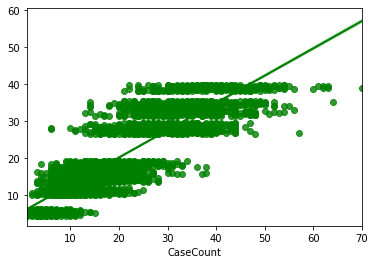

In [100]:
ax = sns.regplot(x=y_test, y=y_test_pred, color="g")

In [101]:
print("R2 Score: ",r2_score(y_test, y_test_pred))
print("MAE:", metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

R2 Score:  0.7414336717278749
MAE: 4.629505206675096
MSE: 37.32170167055597
RMSE: 6.109149013615232


In [ ]:
# Why did I choose R-squared as the metric?

# Because R-squared tells us how much of variance can be explained by the linear model. R-squared is conveniently scaled between 0 and 1 and it can be compared with accuracy. Better the model, higher the r2 value.

# The model groups the days according to the district 12 times. This means 12 repetitions each day. This can cause data leakage. Therefore, we will do a more detailed study.



In [ ]:
### Model 2: Predict for each day for Ucr Part 3

## In the previous model, we made an estimate for all Ucr_Parts. We are now customizing the model. Ucr_Part 3 is the Ucr part type with the highest number of crimes. Therefore, we will try to estimate how many crimes can be committed from Ucr_Part 3 in the future.

## part1 : 0.42 part2: 0.57

## Let's remember the Ucr Parts.

   Ucr_Parts  Incident_Number
0          0             1144
1          1            58735
2          2            90577
3          3           146117


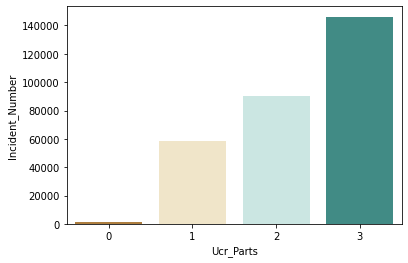

In [102]:
ucr_counts = data.groupby('Ucr_Parts').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Ucr_Parts' , y="Incident_Number", data = ucr_counts,palette='BrBG')
print(ucr_counts)

In [103]:
data["District"].unique()

array(['B2', 'E18', 'C11', 'A1', 'D4', 'C6', 'B3', 'A15', 'D14', 'E13',
       'A7', 'E5'], dtype=object)

In [104]:
# We will feed our model with the number of crimes happening in the districts.

dataD4 = data.loc[data['District'] == "D4"]
dataD4 = dataD4.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataD4 = pd.DataFrame(dataD4.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataD4.rename(columns={ 'Incident_Number': 'countD4','Occurred_On_Date': "DateD4"}, inplace=True)
dataD4 = dataD4.drop("District",axis = 1)

In [105]:
dataD14 = data.loc[data['District'] == "D14"]
dataD14 = dataD14.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataD14 = pd.DataFrame(dataD14.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataD14.rename(columns={ 'Incident_Number': 'countD14','Occurred_On_Date': "DateD14"}, inplace=True)
dataD14 = dataD14.drop("District",axis = 1)

In [106]:
dataC11 = data.loc[data['District'] == "C11"]
dataC11 = dataC11.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataC11 = pd.DataFrame(dataC11.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataC11.rename(columns={ 'Incident_Number': 'countC11','Occurred_On_Date': "DateC11"}, inplace=True)
dataC11 = dataC11.drop("District",axis = 1)

In [107]:
dataB3 = data.loc[data['District'] == "B3"]
dataB3 = dataB3.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataB3 = pd.DataFrame(dataB3.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataB3.rename(columns={ 'Incident_Number': 'countB3', 'Occurred_On_Date': "DateB3"}, inplace=True)
dataB3 = dataB3.drop("District",axis = 1)

In [108]:
dataB2 = data.loc[data['District'] == "B2"]
dataB2 = dataB2.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataB2 = pd.DataFrame(dataB2.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataB2.rename(columns={ 'Incident_Number': 'countB2','Occurred_On_Date': "DateB2"}, inplace=True)
dataB2 = dataB2.drop("District",axis = 1)

In [109]:
dataC6 = data.loc[data['District'] == "C6"]
dataC6 = dataC6.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataC6 = pd.DataFrame(dataC6.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataC6.rename(columns={ 'Incident_Number': 'countC6','Occurred_On_Date': "DateC6"}, inplace=True)
dataC6 = dataC6.drop("District",axis = 1)

In [110]:
dataA1 = data.loc[data['District'] == "A1"]
dataA1 = dataA1.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA1 = pd.DataFrame(dataA1.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA1.rename(columns={ 'Incident_Number': 'countA1','Occurred_On_Date': "DateA1"}, inplace=True)
dataA1 = dataA1.drop("District",axis = 1)

In [112]:
dataE5 = data.loc[data['District'] == "E5"]
dataE5 = dataE5.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE5 = pd.DataFrame(dataE5.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE5.rename(columns={ 'Incident_Number': 'countE5','Occurred_On_Date': "DateE5"}, inplace=True)
dataE5 = dataE5.drop("District",axis = 1)

In [113]:
dataA7 = data.loc[data['District'] == "A7"]
dataA7 = dataA7.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA7 = pd.DataFrame(dataA7.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA7.rename(columns={ 'Incident_Number': 'countA7','Occurred_On_Date': "DateA7"}, inplace=True)
dataA7 = dataA7.drop("District",axis = 1)

In [114]:
dataE13 = data.loc[data['District'] == "E13"]
dataE13 = dataE13.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE13 = pd.DataFrame(dataE13.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE13.rename(columns={ 'Incident_Number': 'countE13','Occurred_On_Date': "DateE13"}, inplace=True)
dataE13 = dataE13.drop("District",axis = 1)

In [115]:
dataE18 = data.loc[data['District'] == "E18"]
dataE18 = dataE18.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE18 = pd.DataFrame(dataE18.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE18.rename(columns={ 'Incident_Number': 'countE18', 'Occurred_On_Date': "DateE18"}, inplace=True)
dataE18 = dataE18.drop("District",axis = 1)

In [116]:
dataA15 = data.loc[data['District'] == "A15"]
dataA15 = dataA15.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA15 = pd.DataFrame(dataA15.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA15.rename(columns={ 'Incident_Number': 'countA15','Occurred_On_Date': "DateA15"}, inplace=True)
dataA15 = dataA15.drop("District",axis = 1)

In [117]:
dataE18

,DateE18,countE18
0,2015-06-15,12
1,2015-06-16,21
2,2015-06-17,21
3,2015-06-18,15
4,2015-06-19,17
...,...,...
1172,2018-08-30,15
1173,2018-08-31,14
1174,2018-09-01,20
1175,2018-09-02,16


In [118]:
dataUCR = data.loc[data['Ucr_Parts'] == 3]
dataUCR = dataUCR.loc[:, ["Incident_Number", 'Ucr_Parts', 'Occurred_On_Date']]
dataUCR = pd.DataFrame(dataUCR.groupby(["Occurred_On_Date","Ucr_Parts"])["Incident_Number"].count()).reset_index()
dataUCR.rename(columns={ 'Incident_Number': 'countUCR','Occurred_On_Date': "DateUCR"}, inplace=True)
dataUCR = dataUCR.drop("Ucr_Parts",axis = 1)

In [119]:
dataUCR

,DateUCR,countUCR
0,2015-06-15,116
1,2015-06-16,108
2,2015-06-17,90
3,2015-06-18,141
4,2015-06-19,116
...,...,...
1172,2018-08-30,126
1173,2018-08-31,138
1174,2018-09-01,142
1175,2018-09-02,111


In [121]:
# We get the daily crime numbers in each district and the crime numbers in Ucr_Part 3.

result = pd.concat([dataUCR,dataD14, dataC11, dataD4, dataB3,dataB2,dataC6, dataA1, dataE5, dataA7, dataE13,
       dataE18, dataA15], axis=1, sort=False)

In [122]:
result = result.drop(["DateUCR",'DateC11','DateD4', 'DateB3',  'DateB2','DateC6',  'DateA1', 'DateE5',  'DateA7',  'DateE13','DateE18',  'DateA15'] ,axis = 1)

In [123]:
result.isnull().sum()

countUCR     0
DateD14      0
countD14     0
countC11     0
countD4      0
countB3      0
countB2      0
countC6      0
countA1      0
countE5      0
countA7      0
countE13     0
countE18     0
countA15    15
dtype: int64

In [124]:
# There is missing data in the A15 district. Let's fill this with average.

result["countA15"] = result["countA15"].fillna(result["countA15"].mean())

In [125]:
# Let's add DayofMonth, Month and Weekday features to our data. Maybe it will help.

result['DayofMonth'] = result['DateD14'].dt.day
result['Month'] = result['DateD14'].dt.month
result['Weekday'] = result['DateD14'].dt.weekday

In [126]:
result

,countUCR,DateD14,countD14,countC11,countD4,countB3,countB2,countC6,countA1,countE5,countA7,countE13,countE18,countA15,DayofMonth,Month,Weekday
0,116,2015-06-15,16,31,40,26,34,16,23,18,10,8,12,5.00000,15,6,0
1,108,2015-06-16,10,41,32,24,39,20,25,7,13,5,21,5.00000,16,6,1
2,90,2015-06-17,13,32,36,25,26,12,24,13,14,7,21,2.00000,17,6,2
3,141,2015-06-18,11,34,30,34,70,16,29,9,8,20,15,8.00000,18,6,3
4,116,2015-06-19,20,36,31,39,58,14,33,11,6,8,17,3.00000,19,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172,126,2018-08-30,24,37,29,31,27,25,23,8,8,10,15,5.30895,30,8,3
1173,138,2018-08-31,27,34,22,21,43,25,16,15,11,21,14,5.30895,31,8,4
1174,142,2018-09-01,30,33,22,27,35,18,25,13,5,15,20,5.30895,1,9,5
1175,111,2018-09-02,17,44,16,21,29,16,17,9,7,10,16,5.30895,2,9,6


In [127]:
# Check for null values.

result.isnull().sum()

countUCR      0
DateD14       0
countD14      0
countC11      0
countD4       0
countB3       0
countB2       0
countC6       0
countA1       0
countE5       0
countA7       0
countE13      0
countE18      0
countA15      0
DayofMonth    0
Month         0
Weekday       0
dtype: int64

In [128]:
# And the final data for the model.

result

,countUCR,DateD14,countD14,countC11,countD4,countB3,countB2,countC6,countA1,countE5,countA7,countE13,countE18,countA15,DayofMonth,Month,Weekday
0,116,2015-06-15,16,31,40,26,34,16,23,18,10,8,12,5.00000,15,6,0
1,108,2015-06-16,10,41,32,24,39,20,25,7,13,5,21,5.00000,16,6,1
2,90,2015-06-17,13,32,36,25,26,12,24,13,14,7,21,2.00000,17,6,2
3,141,2015-06-18,11,34,30,34,70,16,29,9,8,20,15,8.00000,18,6,3
4,116,2015-06-19,20,36,31,39,58,14,33,11,6,8,17,3.00000,19,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172,126,2018-08-30,24,37,29,31,27,25,23,8,8,10,15,5.30895,30,8,3
1173,138,2018-08-31,27,34,22,21,43,25,16,15,11,21,14,5.30895,31,8,4
1174,142,2018-09-01,30,33,22,27,35,18,25,13,5,15,20,5.30895,1,9,5
1175,111,2018-09-02,17,44,16,21,29,16,17,9,7,10,16,5.30895,2,9,6


In [129]:
result['DateD14'] = pd.to_datetime(result['DateD14'])
result['DateD14'] = result['DateD14'].map(dt.datetime.toordinal)

In [130]:
x_trainUCR, x_testUCR, y_trainUCR, y_testUCR = train_test_split(result.drop(columns=["countUCR"]), result["countUCR"], random_state = 42) 

In [131]:
lr = LinearRegression().fit(x_trainUCR,y_trainUCR)

y_train_predUCR = lr.predict(x_trainUCR)
y_test_predUCR = lr.predict(x_testUCR)

print(lr.score(x_testUCR,y_testUCR))

0.6659677025799543


In [132]:
print("R2 Score: ",r2_score(y_testUCR, y_test_predUCR))
print("MAE:", metrics.mean_absolute_error(y_testUCR, y_test_predUCR))
print('MSE:', metrics.mean_squared_error(y_testUCR, y_test_predUCR))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_testUCR, y_test_predUCR))) 

R2 Score:  0.6659677025799542
MAE: 8.773180449197069
MSE: 115.89887820834849
RMSE: 10.765634129411444


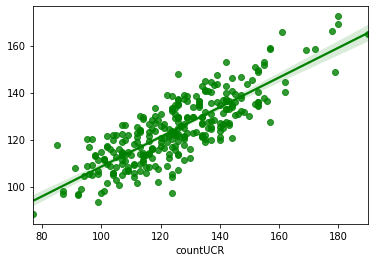

In [133]:
ax = sns.regplot(x=y_testUCR, y=y_test_predUCR, color="g")

In [ ]:
### Model 3: Predict district& location

# Now, we want to predict the region. If we can predict in which region the crime will occur, the police can work by focusing on the regions. It can help tourists plan tours and also plan for security as well.

# In other words, it is important to predict in which district a crime may occur in order to prevent crime.


In [134]:
### Prep for Model 3
# It is important to take action where the crime may occur. We will try to guess at which districts the crime that occurs in this model. We will be using XGB Classifier for its ease of use and predictive power.

# We used the Offense_Code_Group, Year, Seasons, Hour, Shooting, DayOfWeek, Ucr_Parts, Lat, Long features in the first model to predict the districts. However, when we got 99% accuracy, we noticed that Lat and Long columns negatively affected our model. Let's examine.

dataD2 = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","Lat","Long"]]
dataD2['Offense_Code_Group'] = le.fit_transform(dataD2['Offense_Code_Group'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [135]:
X_train_xgb2, X_test_xgb2, y_train_xgb2, y_test_xgb2 = train_test_split(dataD2.drop(["District"], axis = 1), dataD2["District"], test_size=0.20, random_state=42)

In [137]:
scaler = StandardScaler()
scaler.fit(X_train_xgb2)
X_train = scaler.transform(X_train_xgb2)
X_test = scaler.transform(X_test_xgb2)

In [140]:
### Let's build the model.


xgB2 = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=5, random_state=0)
xgB2.fit(X_train_xgb2, y_train_xgb2)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=140, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [142]:
y_predXG2 = xgB2.predict(X_test_xgb2)
cmXG =confusion_matrix(y_test_xgb2, y_predXG2)
print(classification_report(y_test_xgb2, y_predXG2))

              precision    recall  f1-score   support

          A1       0.97      0.99      0.98      6520
         A15       0.98      0.99      0.98      1247
          A7       1.00      0.99      1.00      2651
          B2       0.98      0.98      0.98      9127
          B3       0.99      0.98      0.99      6785
         C11       0.99      0.99      0.99      8097
          C6       0.98      0.97      0.97      4333
         D14       1.00      0.98      0.99      3764
          D4       0.99      0.99      0.99      7562
         E13       0.98      0.99      0.98      3327
         E18       0.98      0.99      0.98      3332
          E5       0.99      0.99      0.99      2570

    accuracy                           0.98     59315
   macro avg       0.99      0.99      0.99     59315
weighted avg       0.98      0.98      0.98     59315



In [ ]:
# We gave the location values that make up our predicted value to the model. And our accuracy is 0.99.

In [ ]:
# When we look at feature importance, we can see how much latitude and longitude values affect our estimation.

[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'Lat')]

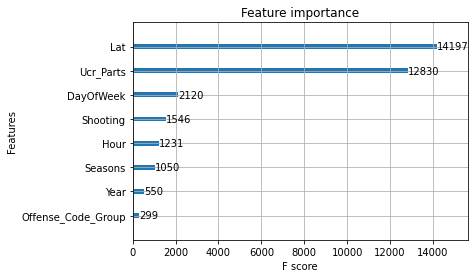

In [143]:
from xgboost import plot_importance
plot_importance(xgB2).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","Lat","Long"])

In [ ]:
# Accuracy is 0.99 because we gave the location while estimating the regions. Now we need to take the columns out of the model and try.
# Creating the day of week column will increase the accuracy.

In [144]:
### Model 3 without Lat and Long

data['DayofMonth'] = data['Occurred_On_Date'].dt.day


In [145]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts', 'DayofMonth'],
      dtype='object')

In [146]:
dataD = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [147]:
dataD["DayofMonth"].nunique()

31

In [148]:
dataD['Offense_Code_Group'] = le.fit_transform(dataD['Offense_Code_Group'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [149]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts', 'DayofMonth'],
      dtype='object')

In [150]:
dataD

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,36,B2,2018,0,9,0,1,3,3,0
137,58,E18,2018,0,10,0,1,3,3,0
127,24,C11,2018,0,11,0,1,2,3,0
128,60,C11,2018,0,11,0,1,3,3,0
129,27,A1,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,58,D4,2015,2,10,0,1,3,15,0
318626,31,D4,2015,2,0,0,1,1,15,1
318625,60,D4,2015,2,12,0,1,3,15,0
318624,28,B2,2015,2,12,0,1,3,15,0


In [151]:
X_train, X_test, y_train, y_test = train_test_split(dataD.drop(["District"], axis = 1), dataD["District"], test_size=0.20, random_state=42)

In [152]:
# from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [153]:
# Let's try The model excluding the latitude and longitude values.

# from xgboost import XGBClassifier

xgB = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=5, random_state=0)
xgB.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=140, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [154]:
# from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report

y_predXG = xgB.predict(X_test)
cmXG =confusion_matrix(y_test, y_predXG)
print(classification_report(y_test, y_predXG))

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

          A1       0.23      0.23      0.23      6520
         A15       0.00      0.00      0.00      1247
          A7       0.50      0.00      0.00      2651
          B2       0.18      0.51      0.27      9127
          B3       0.23      0.13      0.17      6785
         C11       0.18      0.22      0.20      8097
          C6       0.21      0.03      0.05      4333
         D14       0.20      0.02      0.04      3764
          D4       0.23      0.35      0.27      7562
         E13       0.05      0.00      0.00      3327
         E18       0.35      0.01      0.01      3332
          E5       0.29      0.00      0.01      2570

    accuracy                           0.20     59315
   macro avg       0.22      0.13      0.10     59315
weighted avg       0.22      0.20      0.15     59315



[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'DayofMonth'),
 Text(0, 0, 'Night')]

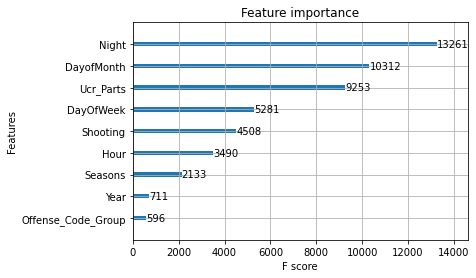

In [155]:
# Feature Importance

plot_importance(xgB).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","DayofMonth","Night"])

In [ ]:
## While predicting the districts, our model was not successful enough. The reasons for this may be the following.

# 1. Districts are close to each other and have no clear boundaries.
# 2. We have a large number of districts.
# 3.We don't have enough data.
## For this reason, we will try to model the districts by grouping them among themselves. So I aim for better prediction.

In [156]:
### Model 3 with Grouped Districts

dataD = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [157]:
dataD

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,Medical Assistance,B2,2018,0,9,0,1,3,3,0
137,Towed,E18,2018,0,10,0,1,3,3,0
127,Harassment,C11,2018,0,11,0,1,2,3,0
128,Verbal Disputes,C11,2018,0,11,0,1,3,3,0
129,Investigate Person,A1,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,Towed,D4,2015,2,10,0,1,3,15,0
318626,Larceny From Motor Vehicle,D4,2015,2,0,0,1,1,15,1
318625,Verbal Disputes,D4,2015,2,12,0,1,3,15,0
318624,Investigate Property,B2,2015,2,12,0,1,3,15,0


In [158]:
dataD3 = data[['Offense_Code_Group','District', 'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [159]:
dataD3['Offense_Code_Group'] = le.fit_transform(dataD3['Offense_Code_Group'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



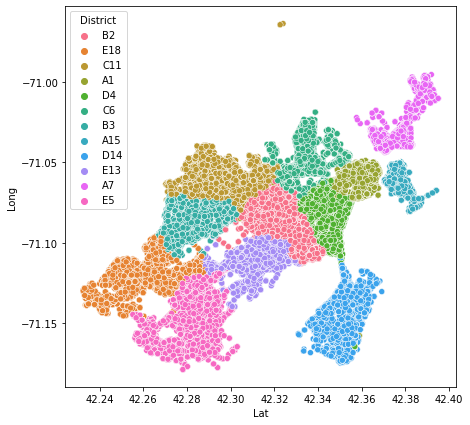

In [160]:
# Let's remember how the districts are distributed within the city.

plt.figure(figsize=(7,7))
sp = data[(data['Lat'] != -1) & (data['Long'] != -1)]
sns.scatterplot(x="Lat", y="Long",hue='District',data=sp)

In [161]:
# Dividing the districts into 3 groups according to their proximity.

dataD3["District"] = dataD3["District"].map({
    
    "E18":1,
    "E5":1,
    "E13":1,
    "B3":1,
    
    "D4":2,
    "B2":2,
    "C11":2,
    "C6":2,
    
    "A15":3,
    "A1":3,
    "A7":3,
    "D14":3,
    
})      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [162]:
"""dataD3["District"] = dataD3["District"].map({
    "B2":3,
    "E18":2,
    "C11":3,
    "A1":1,
    "D4":4,
    "C6":4,
    "B3":2,
    "A15":1,
    "D14":4,
    "E13":3,
    "A7":1,
    "E5":2,
    
})"""    # accuracy 0.38

'dataD3["District"] = dataD3["District"].map({\n    "B2":3,\n    "E18":2,\n    "C11":3,\n    "A1":1,\n    "D4":4,\n    "C6":4,\n    "B3":2,\n    "A15":1,\n    "D14":4,\n    "E13":3,\n    "A7":1,\n    "E5":2,\n    \n})'

In [163]:
# This time in the dataset we have Hour, Ucr_Part,Offense_Code_Group,Shooting,... columns.

# We will try to classify the district groups.

dataD3

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,36,2,2018,0,9,0,1,3,3,0
137,58,1,2018,0,10,0,1,3,3,0
127,24,2,2018,0,11,0,1,2,3,0
128,60,2,2018,0,11,0,1,3,3,0
129,27,3,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,58,2,2015,2,10,0,1,3,15,0
318626,31,2,2015,2,0,0,1,1,15,1
318625,60,2,2015,2,12,0,1,3,15,0
318624,28,2,2015,2,12,0,1,3,15,0


In [164]:
X_train_xgb3, X_test_xgb3, y_train_xgb3, y_test_xgb3 = train_test_split(dataD3.drop(["District"], axis = 1), dataD3["District"], test_size=0.20, random_state=42)

In [165]:
scaler = StandardScaler()
scaler.fit(X_train_xgb3)
X_train = scaler.transform(X_train_xgb3)
X_test = scaler.transform(X_test_xgb3)

In [166]:
xgB3 = XGBClassifier(learning_rate=0.1, n_estimators=50, max_depth=5, random_state=0)
xgB3.fit(X_train_xgb3, y_train_xgb3)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=50, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [167]:
y_predXG3 = xgB3.predict(X_test_xgb3)
cmXG3 =confusion_matrix(y_test_xgb3, y_predXG3)
print(classification_report(y_test_xgb3, y_predXG3))

              precision    recall  f1-score   support

           1       0.58      0.00      0.01     16014
           2       0.49      0.99      0.66     29119
           3       0.53      0.02      0.04     14182

    accuracy                           0.49     59315
   macro avg       0.54      0.34      0.23     59315
weighted avg       0.53      0.49      0.33     59315



[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'DayofMonth'),
 Text(0, 0, 'Night')]

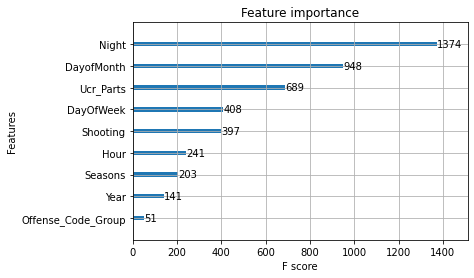

In [168]:
plot_importance(xgB3).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","DayofMonth","Night"])

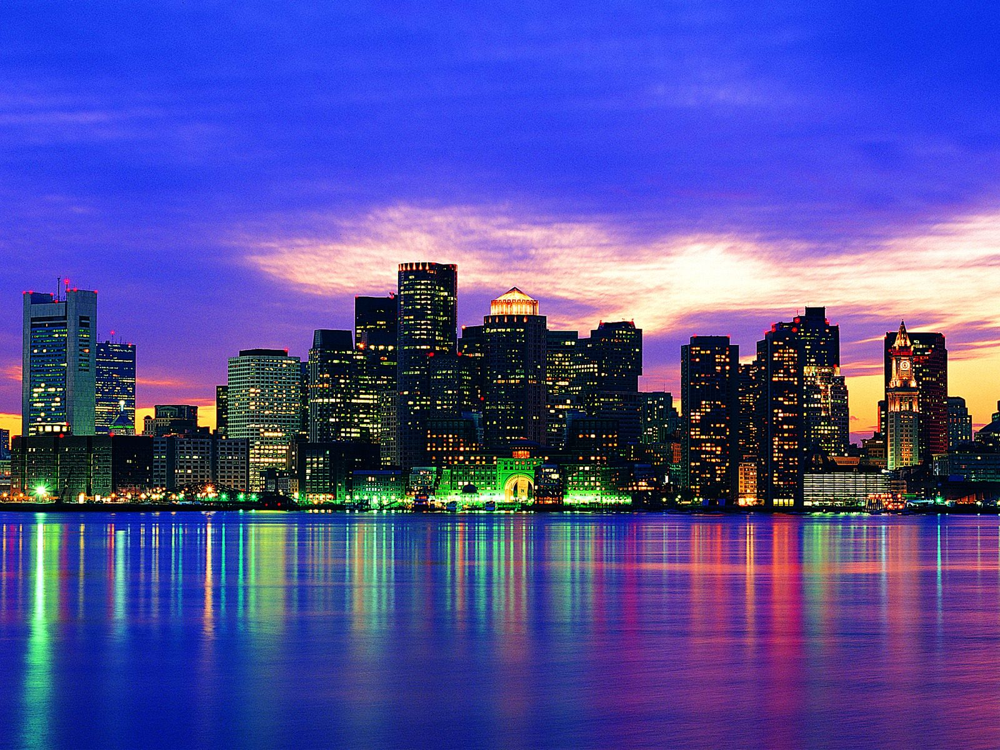